In [1]:
import os
import re
import sys
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import collections

from kolmov.core import ktable, kplot

In [2]:
tuned_info = collections.OrderedDict( {
              # validation
              "max_sp_val"      : 'summary/max_sp_val',
              "max_sp_pd_val"   : 'summary/max_sp_pd_val#0',
              "max_sp_fa_val"   : 'summary/max_sp_fa_val#0',
              # Operation
              "max_sp_op"       : 'summary/max_sp_op',
              "max_sp_pd_op"    : 'summary/max_sp_pd_op#0',
              "max_sp_fa_op"    : 'summary/max_sp_fa_op#0',
              # Tight
              'tight_pd_ref'    : "reference/tight_cutbased/pd_ref#0",
              'tight_fa_ref'    : "reference/tight_cutbased/fa_ref#0",
              'tight_sp_ref'    : "reference/tight_cutbased/sp_ref",
              'tight_pd_val'    : "reference/tight_cutbased/pd_val#0",
              'tight_fa_val'    : "reference/tight_cutbased/fa_val#0",
              'tight_sp_val'    : "reference/tight_cutbased/sp_val",
              'tight_pd_op'     : "reference/tight_cutbased/pd_op#0",
              'tight_fa_op'     : "reference/tight_cutbased/fa_op#0",
              'tight_sp_op'     : "reference/tight_cutbased/sp_op",
              # Medium
              'medium_pd_ref'   : "reference/medium_cutbased/pd_ref#0",
              'medium_fa_ref'   : "reference/medium_cutbased/fa_ref#0",
              'medium_sp_ref'   : "reference/medium_cutbased/sp_ref",
              'medium_pd_val'   : "reference/medium_cutbased/pd_val#0",
              'medium_fa_val'   : "reference/medium_cutbased/fa_val#0",
              'medium_sp_val'   : "reference/medium_cutbased/sp_val",
              'medium_pd_op'    : "reference/medium_cutbased/pd_op#0",
              'medium_fa_op'    : "reference/medium_cutbased/fa_op#0",
              'medium_sp_op'    : "reference/medium_cutbased/sp_op",
              # Loose
              'loose_pd_ref'    : "reference/loose_cutbased/pd_ref#0",
              'loose_fa_ref'    : "reference/loose_cutbased/fa_ref#0",
              'loose_sp_ref'    : "reference/loose_cutbased/sp_ref",
              'loose_pd_val'    : "reference/loose_cutbased/pd_val#0",
              'loose_fa_val'    : "reference/loose_cutbased/fa_val#0",
              'loose_sp_val'    : "reference/loose_cutbased/sp_val",
              'loose_pd_op'     : "reference/loose_cutbased/pd_op#0",
              'loose_fa_op'     : "reference/loose_cutbased/fa_op#0",
              'loose_sp_op'     : "reference/loose_cutbased/sp_op",
              # Very Loose
              'vloose_pd_ref'   : "reference/vloose_cutbased/pd_ref#0",
              'vloose_fa_ref'   : "reference/vloose_cutbased/fa_ref#0",
              'vloose_sp_ref'   : "reference/vloose_cutbased/sp_ref",
              'vloose_pd_val'   : "reference/vloose_cutbased/pd_val#0",
              'vloose_fa_val'   : "reference/vloose_cutbased/fa_val#0",
              'vloose_sp_val'   : "reference/vloose_cutbased/sp_val",
              'vloose_pd_op'    : "reference/vloose_cutbased/pd_op#0",
              'vloose_fa_op'    : "reference/vloose_cutbased/fa_op#0",
              'vloose_sp_op'    : "reference/vloose_cutbased/sp_op",
               # Counts
              'tight_pd_ref_passed'    : "reference/tight_cutbased/pd_ref#1",
              'tight_fa_ref_passed'    : "reference/tight_cutbased/fa_ref#1",
              'tight_pd_ref_total'    : "reference/tight_cutbased/pd_ref#2",
              'tight_fa_ref_total'    : "reference/tight_cutbased/fa_ref#2",
              
              'tight_pd_val_passed'    : "reference/tight_cutbased/pd_val#1",
              'tight_fa_val_passed'    : "reference/tight_cutbased/fa_val#1",
              'tight_pd_val_total'     : "reference/tight_cutbased/pd_val#2",
              'tight_fa_val_total'     : "reference/tight_cutbased/fa_val#2",
              
              'tight_pd_op_passed'     : "reference/tight_cutbased/pd_op#1",
              'tight_fa_op_passed'     : "reference/tight_cutbased/fa_op#1",
              'tight_pd_op_total'     : "reference/tight_cutbased/pd_op#2",
              'tight_fa_op_total'     : "reference/tight_cutbased/fa_op#2",
              } )

In [3]:
kt = ktable( tuned_info )

kt.fill('/volume/new_v1_task/*/*.pic.gz', 'v1')


In [4]:
table = kt.get_pandas_table()
table.head(5)

,train_tag,et_bin,eta_bin,model_idx,sort,init,file_name,tuned_idx,max_sp_val,max_sp_pd_val,...,tight_pd_ref_total,tight_fa_ref_total,tight_pd_val_passed,tight_fa_val_passed,tight_pd_val_total,tight_fa_val_total,tight_pd_op_passed,tight_fa_op_passed,tight_pd_op_total,tight_fa_op_total
0,v1,1,3,6,0,20,/volume/new_v1_task/user.mverissi.task.data17_...,0,0.948031,0.961240,...,3865,127374,12615,854,13124,13124,126247,12348,131239,131239
1,v1,1,3,6,0,21,/volume/new_v1_task/user.mverissi.task.data17_...,1,0.946562,0.968992,...,3865,127374,12615,966,13124,13124,126247,13447,131239,131239
2,v1,1,3,6,0,22,/volume/new_v1_task/user.mverissi.task.data17_...,2,0.946583,0.963824,...,3865,127374,12615,905,13124,13124,126247,13434,131239,131239
3,v1,1,3,6,0,23,/volume/new_v1_task/user.mverissi.task.data17_...,3,0.944153,0.961240,...,3865,127374,12615,955,13124,13124,126247,13576,131239,131239
4,v1,1,3,6,0,24,/volume/new_v1_task/user.mverissi.task.data17_...,4,0.947793,0.968992,...,3865,127374,12615,921,13124,13124,126247,13409,131239,131239


### Get the best inits table

In [5]:
best_inits = kt.filter_inits("max_sp_val")
best_inits.head()

,train_tag,et_bin,eta_bin,model_idx,sort,init,file_name,tuned_idx,max_sp_val,max_sp_pd_val,...,tight_pd_ref_total,tight_fa_ref_total,tight_pd_val_passed,tight_fa_val_passed,tight_pd_val_total,tight_fa_val_total,tight_pd_op_passed,tight_fa_op_passed,tight_pd_op_total,tight_fa_op_total
22652,v1,0,0,0,0,2,/volume/new_v1_task/user.mverissi.task.data17_...,2,0.949652,0.963106,...,28455,205005,22960,2283,23346,23346,229620,25395,233460,233460
23171,v1,0,0,0,1,21,/volume/new_v1_task/user.mverissi.task.data17_...,21,0.946421,0.961349,...,28455,205005,22960,2767,23346,23346,229620,25921,233460,233460
25047,v1,0,0,0,2,17,/volume/new_v1_task/user.mverissi.task.data17_...,47,0.942529,0.950457,...,28455,205005,22960,3360,23346,23346,229620,25472,233460,233460
22713,v1,0,0,0,3,3,/volume/new_v1_task/user.mverissi.task.data17_...,63,0.946319,0.965214,...,28455,205005,22960,2511,23346,23346,229620,26034,233460,233460
23236,v1,0,0,0,4,26,/volume/new_v1_task/user.mverissi.task.data17_...,86,0.947559,0.967323,...,28455,205005,22960,2679,23346,23346,229620,25782,233460,233460


**Note**: In this example case, after apply the init filter there are other models that you can analyze. In this example in focus on with 5 neurons in hidden layer. If you don't do that the other models will be used in the calculation and this can be a problem.

In [6]:
best_inits.shape, best_inits.model_idx.nunique()*15*10

((1650, 62), 1650)

In [7]:
print('Dataframe size before model filter: %i' %(len(best_inits)))
c_model    = 0
best_inits = best_inits.loc[best_inits.model_idx==c_model]
print('Dataframe size after model filter: %i' %(len(best_inits)))

Dataframe size before model filter: 1650
Dataframe size after model filter: 150


### Get the Cross validation table

In [8]:
# Get the eff table for all tunings 
cv_table   = kt.describe( best_inits )
cv_table.head()

,train_tag,et_bin,eta_bin,max_sp_val_mean,max_sp_val_std,max_sp_pd_val_mean,max_sp_pd_val_std,max_sp_fa_val_mean,max_sp_fa_val_std,max_sp_op_mean,...,tight_pd_ref_total,tight_fa_ref_total,tight_pd_val_total_mean,tight_pd_val_total_std,tight_fa_val_total_mean,tight_fa_val_total_std,tight_pd_op_total_mean,tight_pd_op_total_std,tight_fa_op_total_mean,tight_fa_op_total_std
0,v1,0,0,0.947717,0.002573,0.962081,0.006446,0.066525,0.005200,0.946671,...,28455,205005,23346.0,0.000000,23346.0,0.000000,233460.0,0.0,233460.0,0.0
1,v1,0,1,0.935984,0.005149,0.948487,0.013846,0.076388,0.007595,0.932650,...,8736,171335,18007.1,0.316228,18007.1,0.316228,180071.0,0.0,180071.0,0.0
2,v1,0,2,0.898481,0.019506,0.923837,0.039799,0.126198,0.023235,0.870352,...,499,27116,2761.5,0.527046,2761.5,0.527046,27615.0,0.0,27615.0,0.0
3,v1,0,3,0.921778,0.005279,0.949518,0.007337,0.105540,0.006665,0.917345,...,6656,229486,23614.2,0.421637,23614.2,0.421637,236142.0,0.0,236142.0,0.0
4,v1,0,4,0.937298,0.020307,0.989153,0.017468,0.113017,0.032696,0.896342,...,272,16670,1694.2,0.421637,1694.2,0.421637,16942.0,0.0,16942.0,0.0


### Get the integrated table for v1 tag

In [9]:
# Get integrated table
int_table = kt.integrate( best_inits, 'v1')
(int_table.head()*100).round(4)

,tight_pd_ref,tight_fa_ref,tight_pd_val,tight_fa_val,tight_pd_op,tight_fa_op
mean,97.7795,36.9054,96.7916,10.0263,96.7977,10.1338
std,0.0000,0.0000,0.0540,0.9573,0.0002,0.1957


### Create the Beamer Presentation

In [10]:
zee_et_lims    = [15,20,25,30,40,50]
jpsiee_et_lims = [4, 7, 10, 15]
eta_lims       = [0, 0.8 , 1.37, 1.54, 2.37, 2.5]

In [11]:
# Create beamer presentation
kt.dump_beamer_table( pandas_best_inits=best_inits,
                      etbins=jpsiee_et_lims, etabins=eta_lims,
                      operation_points=['tight'],
                      output_file_name='new_v1'
                    )

### Create monitoring plots

In [12]:
# Dump all v1 training for a give train tag
kt.dump_all_history( best_inits, '/volume/new_v1_task/analysis/history_new_v1','v1' )

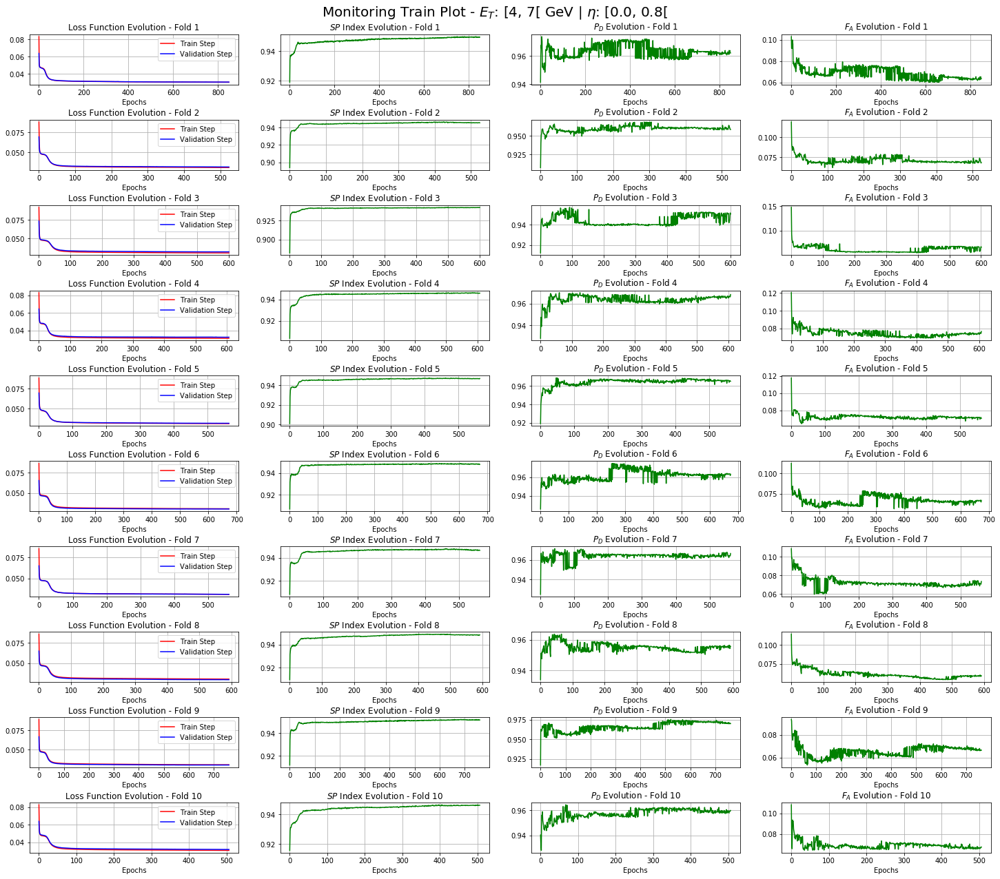

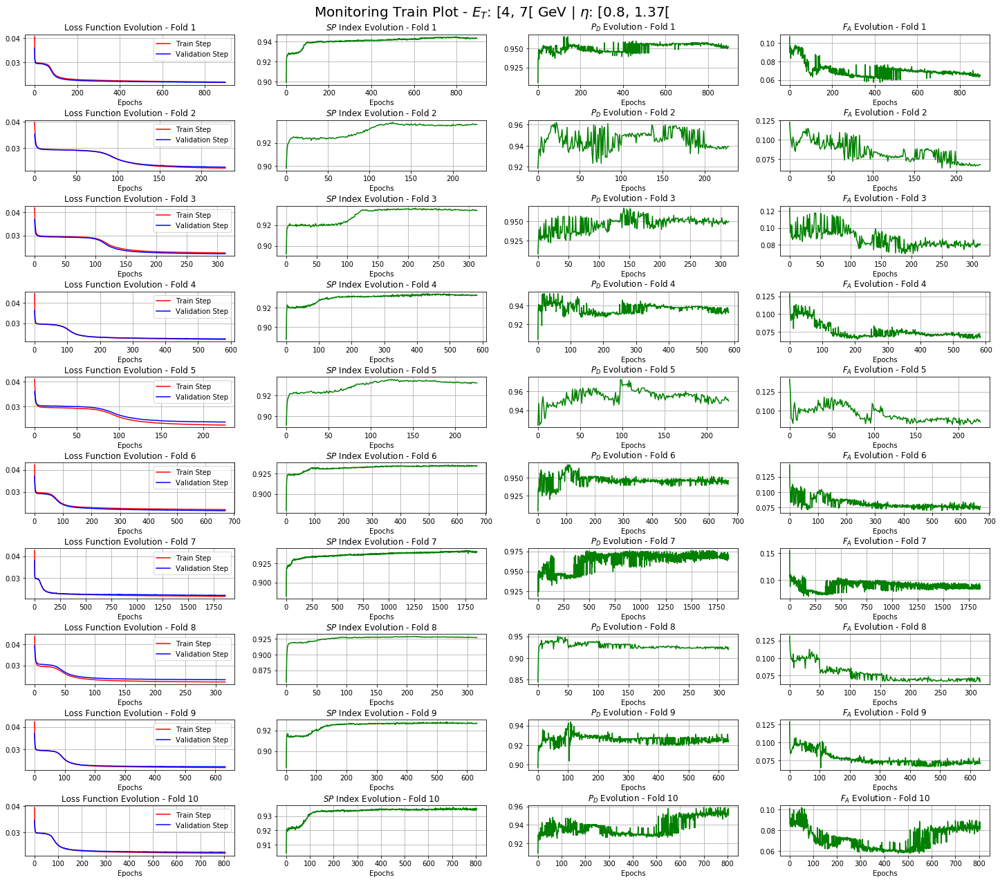

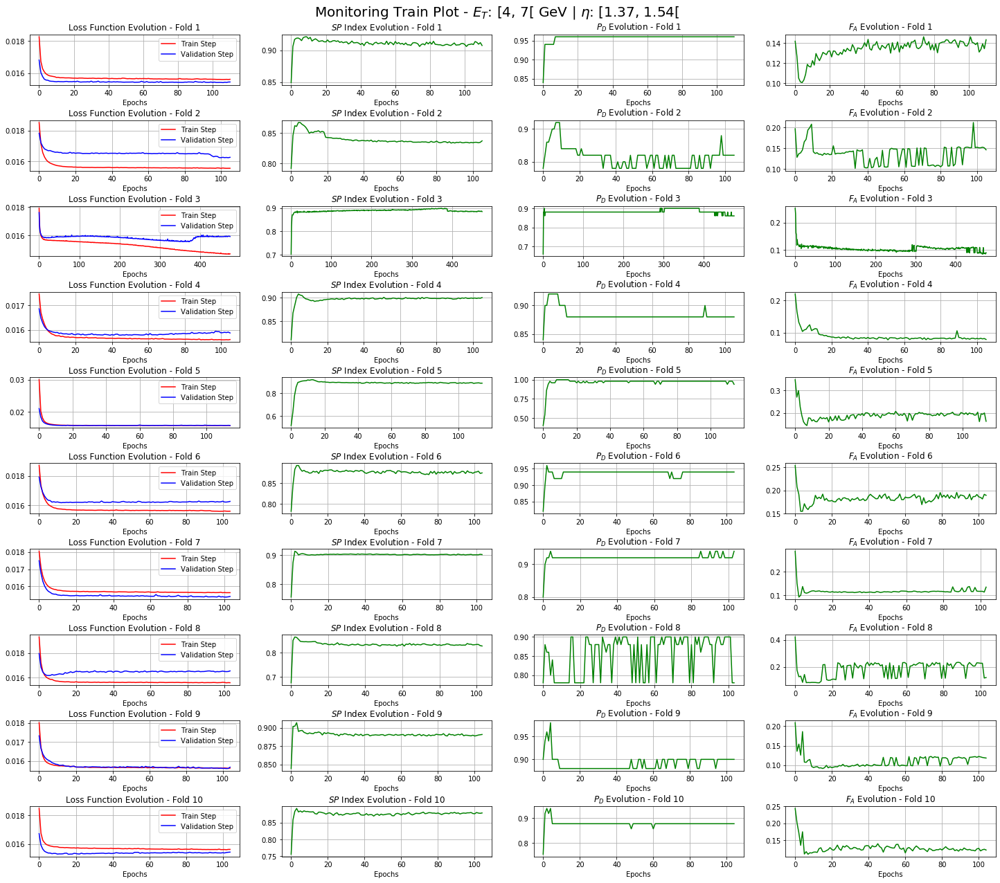

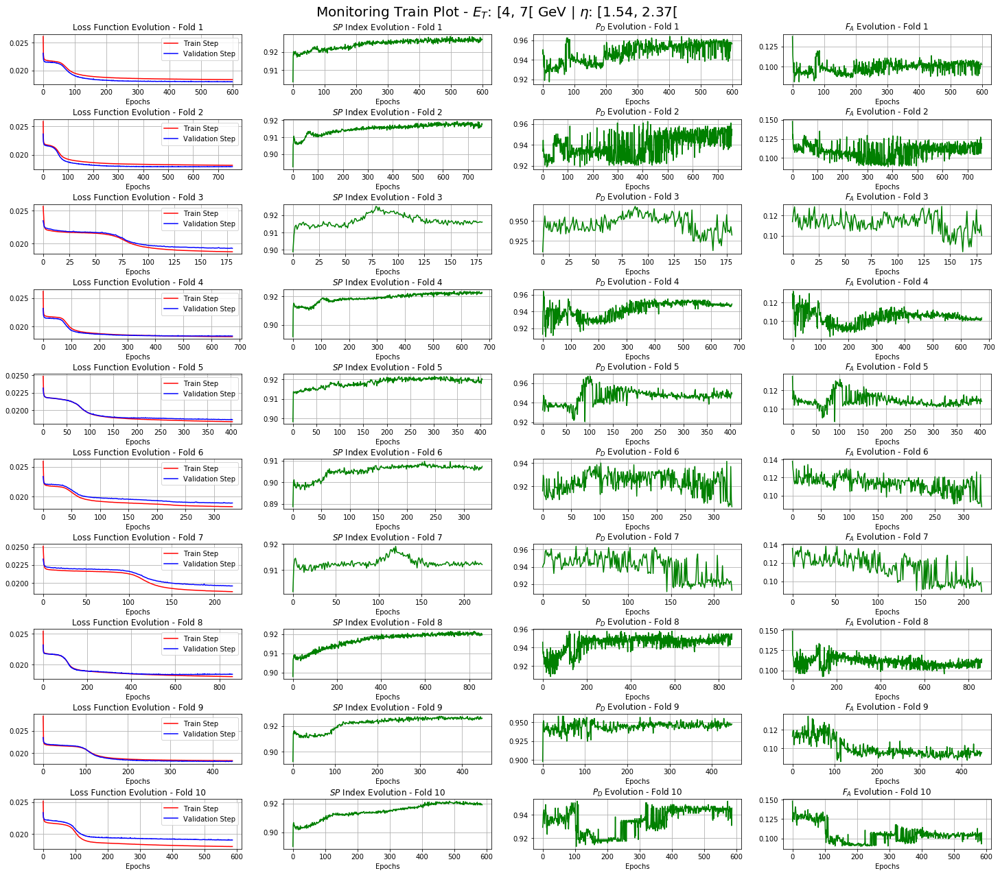

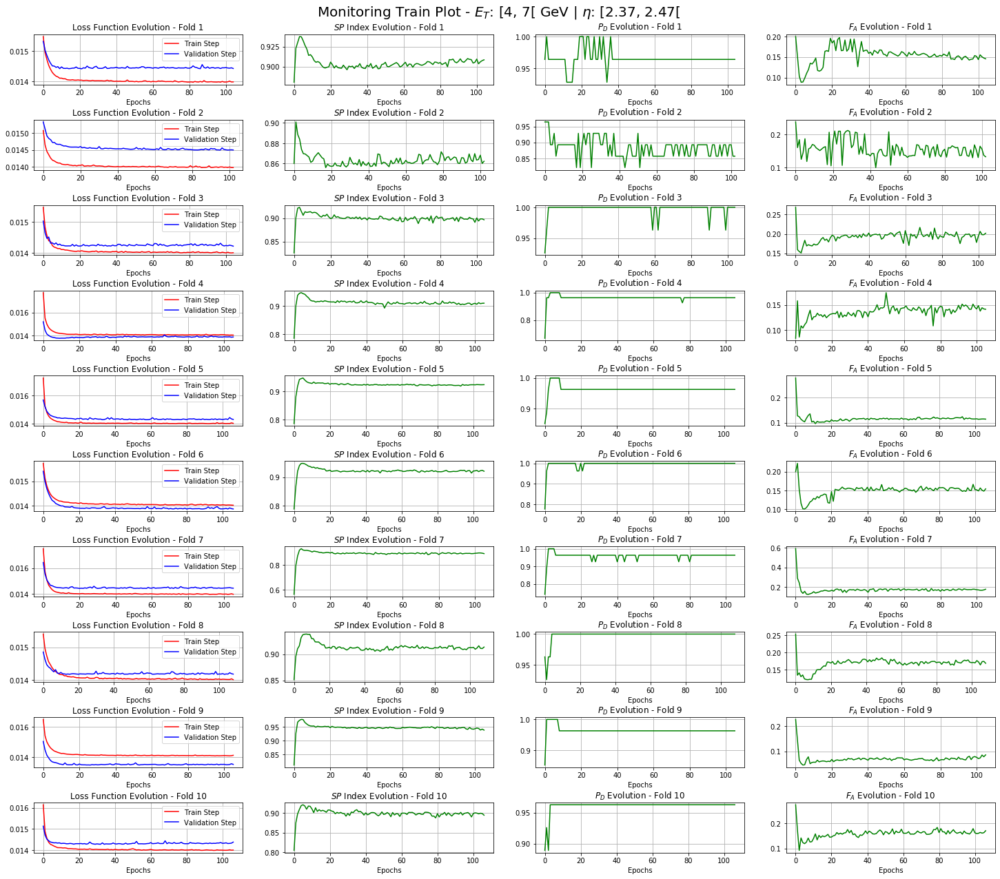

...

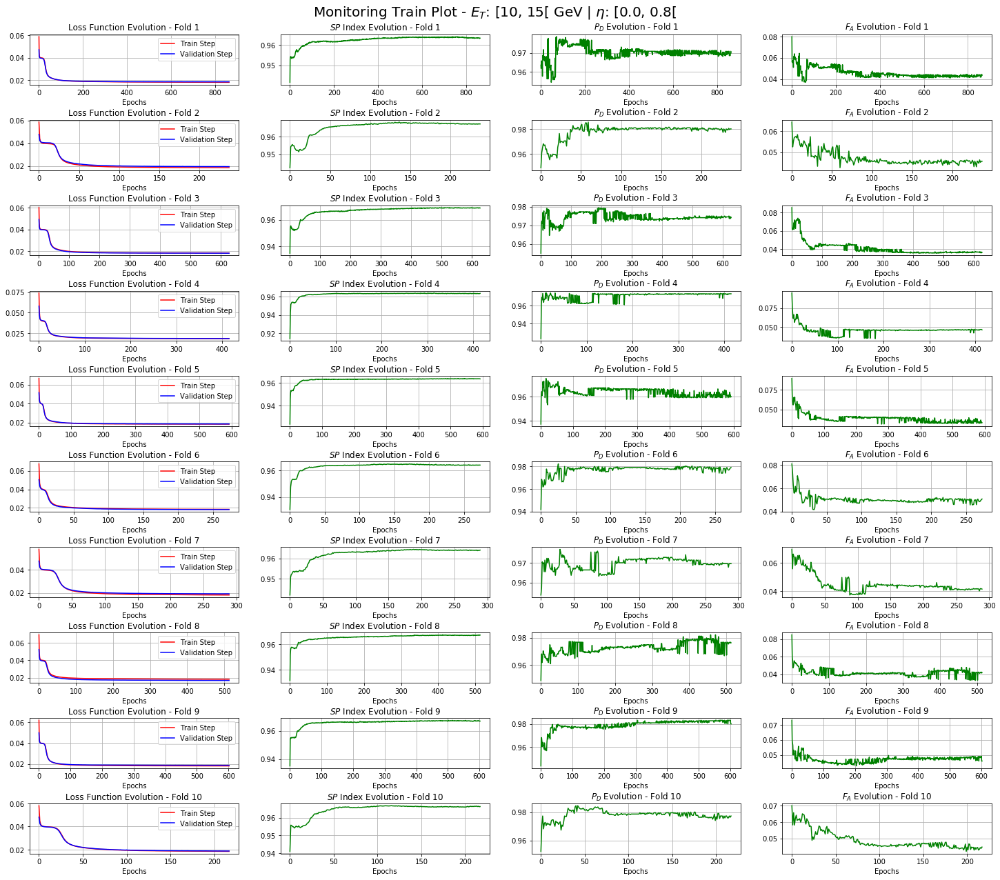

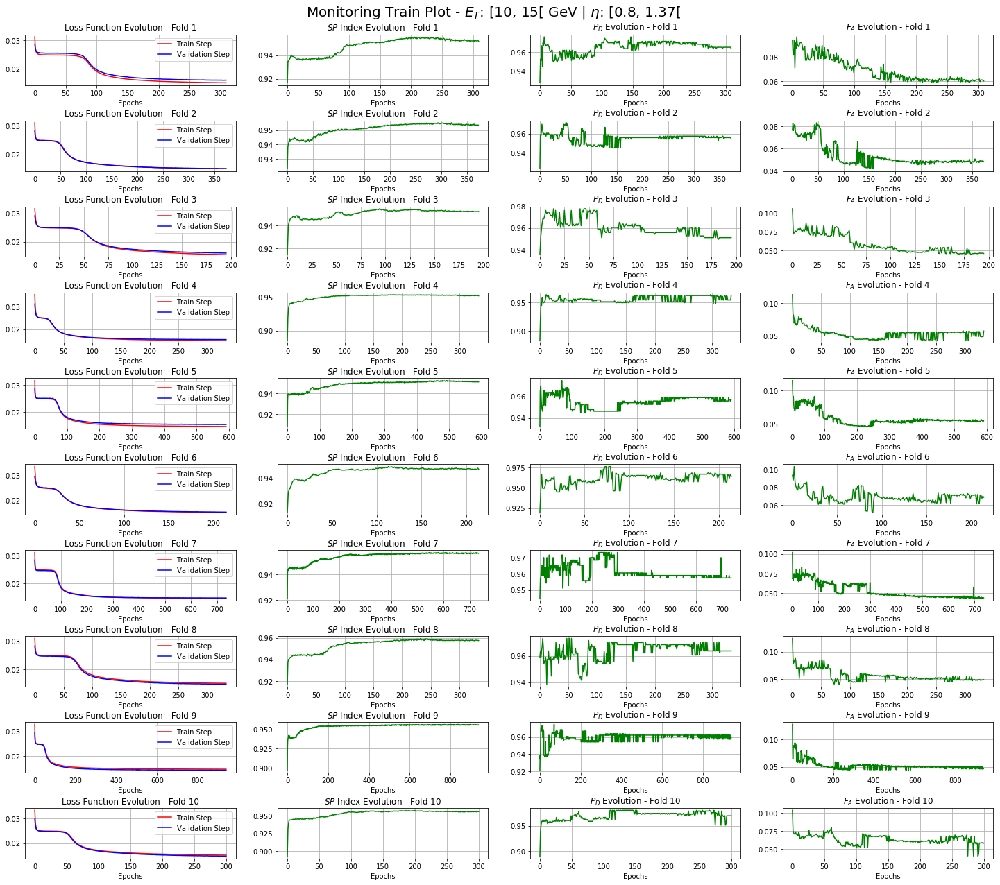

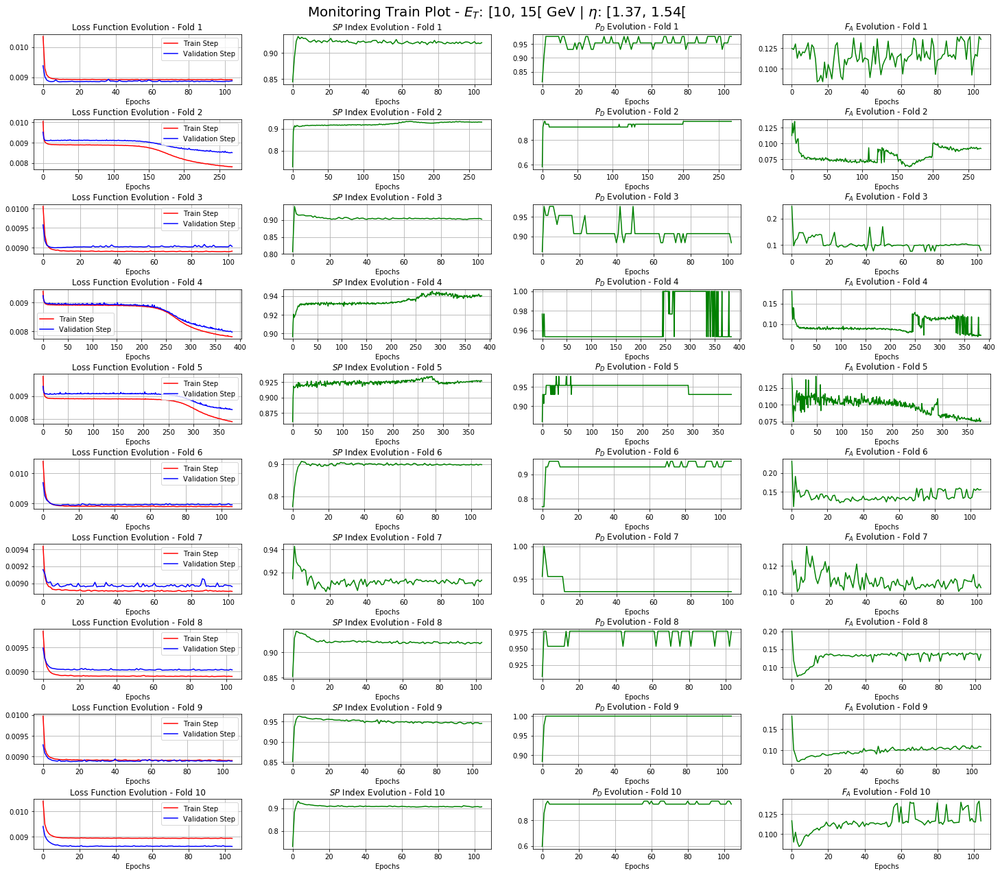

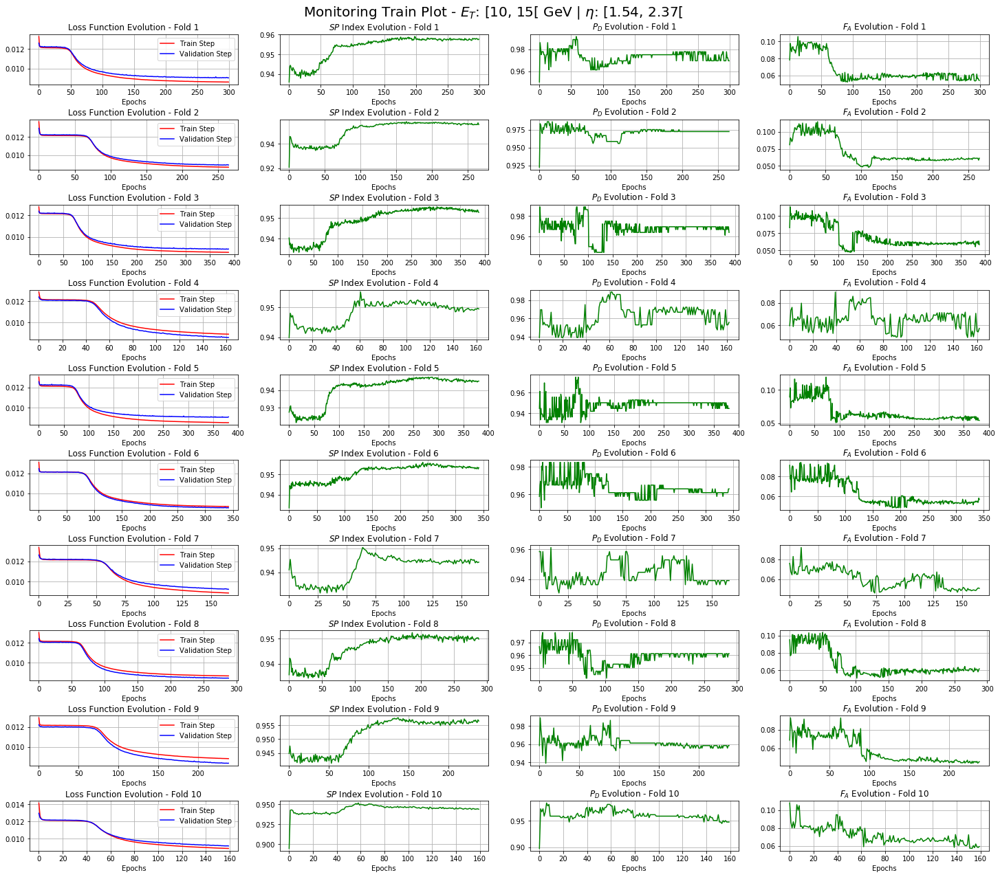

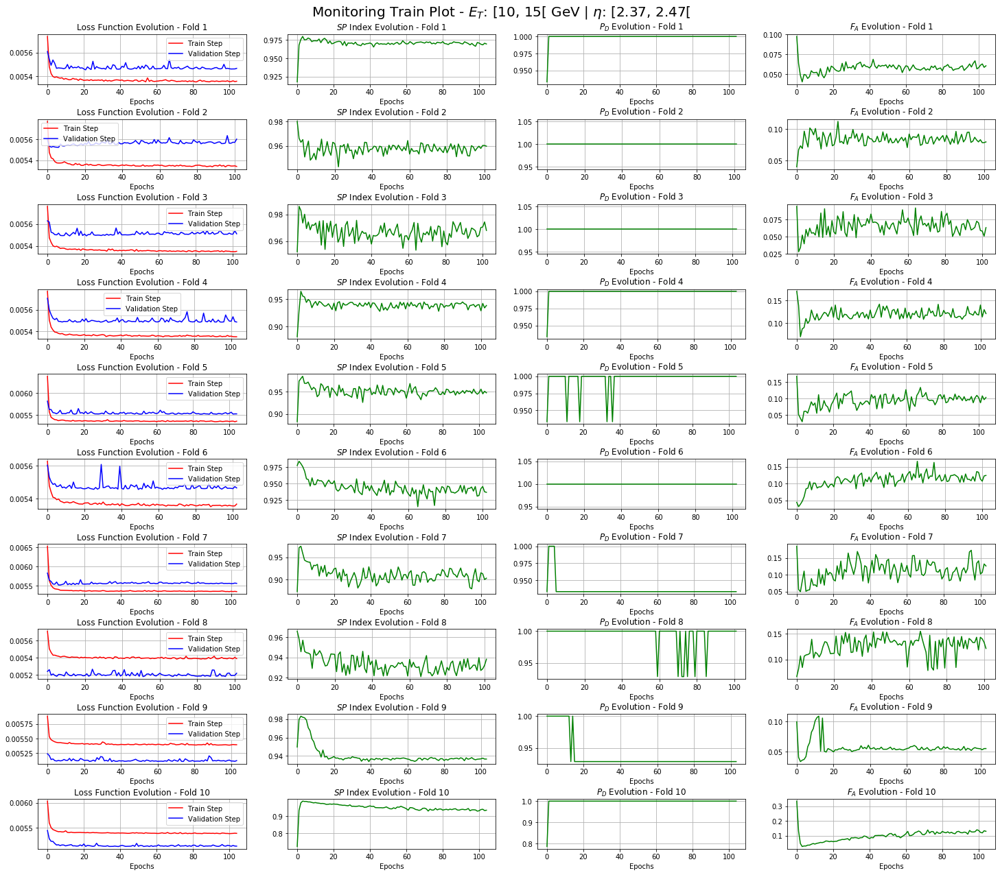

In [13]:
# Plot the monitoring curves
# Get the jpsiee et bins.
from kolmov.core.constants import str_etbins_jpsiee
kplot_tool = kplot( '/volume/new_v1_task/analysis/history_new_v1', 0, str_et_bins=str_etbins_jpsiee)

# Plot all bins.
for iet in range(3):
    for ieta in range(5):
        kplot_tool.plot_training_curves(iet, ieta,
                                        '/volume/new_v1_task/analysis/plots',
                                        'monitoring_new_v1_et%i_eta%i' %(iet, ieta))